In [1]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 9.0 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-cc8giyde
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-cc8giyde
  Resolved https://github.com/facebookresearch/detectron2.git to commit 9604f5995cc628619f0e4fd913453b4d7d61db3f
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.5 ; cuda:  cu124
detectron2: 0.6


In [3]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

In [4]:
import json
import os
import cv2
import random
import glob
import numpy as np
if IN_COLAB:
  from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
import torch
import torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [6]:
# Setup detectron2 loggerimport torch
import torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from concurrent.futures import ProcessPoolExecutor
import os
import pandas as pd

In [7]:
if torch.cuda.is_available():
    GPU = True
    print('gpu available')
else:
    GPU = False
    print('no gpu')

gpu available


In [8]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import joblib
import matplotlib.pyplot as plt
import skimage.io as io
import albumentations as A
from sklearn.preprocessing import StandardScaler

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.config import CfgNode as CN
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.structures import BoxMode, PolygonMasks
from detectron2.evaluation import COCOEvaluator,SemSegEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetMapper

# Set base params
plt.rcParams["figure.figsize"] = [16,9]

import seaborn as sns
from matplotlib import colors
from tensorboard.backend.event_processing import event_accumulator as ea
from PIL import Image

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [9]:
# Google Drive mount (only if in Colab)
IN_COLAB = "google.colab" in str(get_ipython())
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
# Extract dataset zip file
if IN_COLAB:
    import zipfile
    zip_file_name = "/content/drive/MyDrive/dataa.zip"
    destination_folder = "damage"
    with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
        zip_ref.extractall(destination_folder)

In [11]:
train_dir = "/content/damage/dataa/train2017"
val_dir = "/content/damage/dataa/val2017"
test_dir = "/content/damage/dataa/test2017"

register_coco_instances("Train", {}, os.path.join(train_dir,"instances_train2017.json"), os.path.join(train_dir))
register_coco_instances("Valid", {}, os.path.join(val_dir,"instances_val2017.json"), os.path.join(val_dir))

damage_type_dataset_dicts = DatasetCatalog.get("Train")
damage_type_metadata_dicts = MetadataCatalog.get("Train")
damage_type_metadata_dicts

[02/03 11:26:52 d2.data.datasets.coco]: Loaded 2816 images in COCO format from /content/damage/dataa/train2017/instances_train2017.json


namespace(name='Train',
          json_file='/content/damage/dataa/train2017/instances_train2017.json',
          image_root='/content/damage/dataa/train2017',
          evaluator_type='coco',
          thing_classes=['dent',
                         'scratch',
                         'crack',
                         'glass shatter',
                         'lamp broken',
                         'tire flat'],
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             3: 2,
                                             4: 3,
                                             5: 4,
                                             6: 5})

In [12]:
from detectron2.modeling.roi_heads import StandardROIHeads
import torch.nn as nn

class CustomROIHeads(StandardROIHeads):
    def __init__(self, cfg):
        super().__init__(cfg)
        self.dropout = nn.Dropout(p=0.5)

    def forward(self, *args, **kwargs):
        x = super().forward(*args, **kwargs)
        return self.dropout(x)


In [14]:
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

# Correct dataset names
cfg.DATASETS.TRAIN = ("Train",)
cfg.DATASETS.TEST = ("Valid",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.INPUT.CROP.ENABLED = True

# Load weights (either COCO or your custom trained weights)
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
# Or use:
cfg.MODEL.WEIGHTS = "/content/model_final (1).pth"

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00005  # Lower learning rate for fine-tuning
cfg.SOLVER.MAX_ITER = 30000  # More iterations for better training
cfg.SOLVER.STEPS = (40000, 45000)  # Adjust learning rate decay steps
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # Ensure this matches your dataset
cfg.TEST.EVAL_PERIOD = 1000  # Adjust evaluation frequency

# Create output directory
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [15]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()




[02/03 11:32:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

KeyboardInterrupt: 

In [18]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/model_final (1).pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.60 # set the testing threshold for this model
cfg.DATASETS.TEST = ("Valid", )
predictor = DefaultPredictor(cfg)

[02/03 11:32:48 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/model_final (1).pth ...


In [ ]:
#cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/model_final (1).pth")
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.70 # set the testing threshold for this model
#cfg.DATASETS.TEST = ("Valid", )
#predictor = DefaultPredictor(cfg)

[01/23 13:19:43 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/model_final (1).pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

In [20]:
evaluator = COCOEvaluator("Valid", cfg, False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "Valid")
inference_on_dataset(predictor.model, test_loader, evaluator)

WARNING [02/03 11:33:04 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[02/03 11:33:04 d2.data.datasets.coco]: Loaded 810 images in COCO format from /content/damage/dataa/val2017/instances_val2017.json
[02/03 11:33:04 d2.data.build]: Distribution of instances among all 6 categories:
|   category    | #instances   |  category   | #instances   |  category  | #instances   |
|:-------------:|:-------------|:-----------:|:-------------|:----------:|:-------------|
|     dent      | 501          |   scratch   | 728          |   crack    | 177          |
| glass shatter | 135          | lamp broken | 141          | tire flat  | 62           |
|               |              |             |              |            |              |
|     total     | 1744         |             |              |            |              |
[02/03 11:33:04 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used i

/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/03 11:33:08 d2.evaluation.evaluator]: Inference done 11/810. Dataloading: 0.0014 s/iter. Inference: 0.1047 s/iter. Eval: 0.0044 s/iter. Total: 0.1106 s/iter. ETA=0:01:28
[02/03 11:33:13 d2.evaluation.evaluator]: Inference done 56/810. Dataloading: 0.0026 s/iter. Inference: 0.1067 s/iter. Eval: 0.0027 s/iter. Total: 0.1120 s/iter. ETA=0:01:24
[02/03 11:33:18 d2.evaluation.evaluator]: Inference done 96/810. Dataloading: 0.0041 s/iter. Inference: 0.1104 s/iter. Eval: 0.0040 s/iter. Total: 0.1187 s/iter. ETA=0:01:24
[02/03 11:33:23 d2.evaluation.evaluator]: Inference done 143/810. Dataloading: 0.0033 s/iter. Inference: 0.1082 s/iter. Eval: 0.0035 s/iter. Total: 0.1151 s/iter. ETA=0:01:16
[02/03 11:33:28 d2.evaluation.evaluator]: Inference done 189/810. Dataloading: 0.0030 s/iter. Inference: 0.1078 s/iter. Eval: 0.0033 s/iter. Total: 0.1142 s/iter. ETA=0:01:10
[02/03 11:33:33 d2.evaluation.evaluator]: Inference done 227/810. Dataloading: 0.0036 s/iter. Inference: 0.1103 s/iter. Eval: 0.

OrderedDict([('bbox',
              {'AP': 34.71077985029997,
               'AP50': 46.97498755480616,
               'AP75': 38.36613681688845,
               'APs': 0.0,
               'APm': 1.5726726399857838,
               'APl': 36.45751032320001,
               'AP-dent': 12.30210701733186,
               'AP-scratch': 16.712728390113455,
               'AP-crack': 0.0,
               'AP-glass shatter': 80.31889382136012,
               'AP-lamp broken': 34.67250294076457,
               'AP-tire flat': 64.2584469322298}),
             ('segm',
              {'AP': 35.870838656086434,
               'AP50': 46.70783586456838,
               'AP75': 38.06989316651253,
               'APs': 0.0,
               'APm': 0.9769633908525522,
               'APl': 37.68870363701123,
               'AP-dent': 11.78042121264562,
               'AP-scratch': 15.328548894986882,
               'AP-crack': 0.0,
               'AP-glass shatter': 82.27356494333551,
               'AP-lamp 

In [24]:
%reload_ext tensorboard
%tensorboard --logdir ./output/

Reusing TensorBoard on port 6007 (pid 5806), started 0:00:27 ago. (Use '!kill 5806' to kill it.)

<IPython.core.display.Javascript object>

In [23]:
 %reload_ext tensorboard

In [25]:
dataset_dicts = DatasetCatalog.get("Valid")

[02/03 11:37:33 d2.data.datasets.coco]: Loaded 810 images in COCO format from /content/damage/dataa/val2017/instances_val2017.json


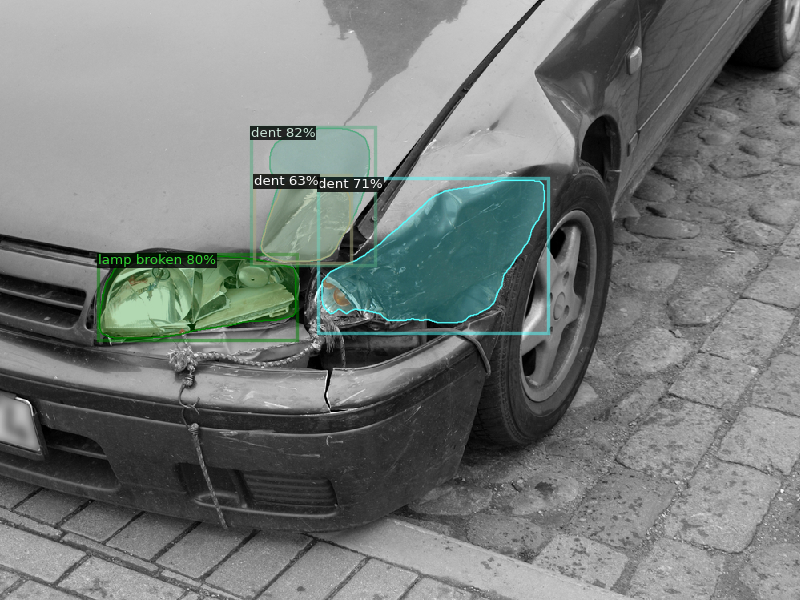

In [33]:
for d in random.sample(dataset_dicts, 1):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("Valid"),
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

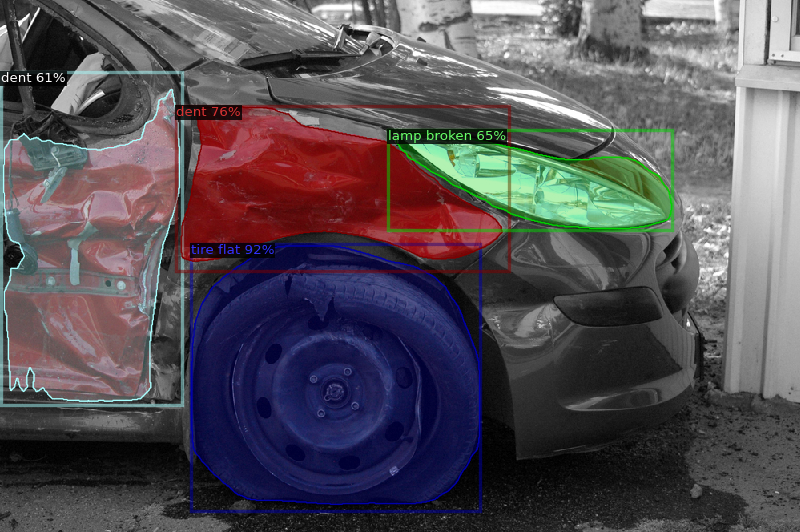

In [53]:
custom_image_path = "/content/damage/dataa/test2017/000237.jpg"
im = cv2.imread(custom_image_path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
               metadata=MetadataCatalog.get("Valid"),
               scale=0.8,
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
from google.colab import files


In [98]:
import numpy as np
import pandas as pd
import os
import cv2
import ast
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from pycocotools.coco import COCO
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
import joblib

In [116]:
# Load COCO annotations
train_annotations_path = os.path.join(train_dir, "instances_train2017.json")
train_coco = COCO(train_annotations_path)

# Initialize DataFrame
results_df = pd.DataFrame(columns=['image_id', 'category', 'predicted_box', 'ground_truth_box'])

# Process images and predictions
for image_id in train_coco.getImgIds():
    image_info = train_coco.loadImgs(image_id)[0]
    image_path = os.path.join(train_dir, image_info['file_name'])
    im = cv2.imread(image_path)

    # Make predictions
    outputs = predictor(im)
    predicted_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    predicted_classes = outputs["instances"].pred_classes.cpu().numpy()
    scores = outputs["instances"].scores.cpu().numpy()

    # Load ground truth annotations
    ann_ids = train_coco.getAnnIds(imgIds=image_id)
    ground_truth_boxes = [train_coco.loadAnns(ann_id)[0]['bbox'] for ann_id in ann_ids]

    # Store results in DataFrame
    for box, cls, score in zip(predicted_boxes, predicted_classes, scores):
        new_row = pd.DataFrame([{
            'image_id': image_info['file_name'],
            'category': cls,
            'predicted_box': box.tolist(),
            'ground_truth_box': ground_truth_boxes
        }])
        results_df = pd.concat([results_df, new_row], ignore_index=True)

loading annotations into memory...
Done (t=0.19s)
creating index...
index created!


In [117]:
results_df.head()

,image_id,category,predicted_box,ground_truth_box
0,000001.jpg,5,"[171.08279418945312, 109.7848892211914, 850.33...","[[167.04, 40.21, 202.79, 131.34], [160.66, 112..."
1,000001.jpg,1,"[163.5208740234375, 57.53722381591797, 298.175...","[[167.04, 40.21, 202.79, 131.34], [160.66, 112..."
2,000002.jpg,5,"[475.1848449707031, 237.21180725097656, 870.71...","[[476.73, 241.02, 397.2, 346.68]]"
3,000003.jpg,5,"[335.1585998535156, 0.0, 1000.0, 500.231903076...","[[354.29, 0.0, 645.71, 521.12]]"
4,000004.jpg,5,"[127.04638671875, 12.901752471923828, 880.3369...","[[129.29, 0.0, 718.62, 649.69]]"


In [118]:
results_df.to_csv('predicted_boxes_with_ground_truth.csv', index=False)

In [119]:
resultsval_df = pd.DataFrame(columns=['image_id', 'category', 'predicted_box', 'ground_truth_box'])

In [120]:
valid_annotations_path = os.path.join(val_dir, "instances_val2017.json")  # Replace with your actual annotations file
valid_coco = COCO(valid_annotations_path)

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


In [122]:
# Initialize DataFrame before the loop
resultsval_df = pd.DataFrame(columns=['image_id', 'category', 'predicted_box', 'ground_truth_box'])

for image_id in valid_coco.getImgIds():
    image_info = valid_coco.loadImgs(image_id)[0]
    image_path = os.path.join(val_dir, image_info['file_name'])

    # Read the image
    im = cv2.imread(image_path)

    # Ensure image is loaded properly
    if im is None:
        print(f"⚠️ Warning: Could not load image {image_path}")
        continue

    # Make predictions
    outputs = predictor(im)
    predicted_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    predicted_classes = outputs["instances"].pred_classes.cpu().numpy()
    scores = outputs["instances"].scores.cpu().numpy()

    # Load ground truth annotations for the image
    ann_ids = valid_coco.getAnnIds(imgIds=image_id)
    ground_truth_boxes = [valid_coco.loadAnns(ann_id)[0]['bbox'] for ann_id in ann_ids]

    # Loop through the predictions
    for box, cls, score in zip(predicted_boxes, predicted_classes, scores):
        # Create a new DataFrame row
        new_row = pd.DataFrame([{
            'image_id': image_info['file_name'],
            'category': cls,
            'predicted_box': box.tolist(),  # Convert NumPy array to list
            'ground_truth_box': ground_truth_boxes
        }])

        # Use pd.concat() instead of append
        resultsval_df = pd.concat([resultsval_df, new_row], ignore_index=True)


In [123]:
resultsval_df.head()

,image_id,category,predicted_box,ground_truth_box
0,000013.jpg,5,"[321.2474670410156, 239.6946563720703, 567.954...","[[454.28, 227.22, 67.98, 30.59], [401.49, 39.1..."
1,000016.jpg,0,"[58.97957229614258, 177.25465393066406, 365.90...","[[63.87, 184.11, 202.48, 203.05], [253.87, 192..."
2,000017.jpg,1,"[222.0109100341797, 348.5603332519531, 814.488...","[[203.03, 349.84, 613.57, 111.7]]"
3,000024.jpg,1,"[298.8233947753906, 141.3778839111328, 717.907...","[[486.35, 133.3, 171.5, 96.57], [297.98, 138.4..."
4,000025.jpg,1,"[362.2546081542969, 187.97032165527344, 794.61...","[[370.59, 175.11, 432.44, 493.88], [570.56, 46..."


In [124]:
resultsval_df.to_csv('predicted_boxes_with_ground_truth_valid.csv', index=False)

In [125]:
def load_annotations(csv_file_path):
    annotations_df = pd.read_csv(csv_file_path)
    return annotations_df

def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    x_intersection = max(0, min(x1 + w1, x2 + w2) - max(x1, x2))
    y_intersection = max(0, min(y1 + h1, y2 + h2) - max(y1, y2))

    intersection_area = x_intersection * y_intersection
    union_area = w1 * h1 + w2 * h2 - intersection_area

    iou = intersection_area / union_area
    return iou

def assign_cost_for_damagedpart(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(5000, 10000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 5000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(1000, 3000)
    else:
        return np.random.randint(100, 1000)

def assign_cost_for_headlamp(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(3000, 5000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(1500, 3000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(500, 1500)
    else:
        return np.random.randint(100, 500)

def assign_cost_for_rearbumper(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(4000, 9000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3500, 4000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(2000, 3500)
    else:
        return np.random.randint(500, 2000)

def assign_cost_for_door(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(8000, 10000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(5000, 8000)   # Example repair cost for moderate IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 5000)
    else:
        return np.random.randint(1000, 3000)

def assign_cost_for_hood(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(4000, 8000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 4000)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(1600, 3000)
    else:
        return np.random.randint(500, 1500)

def assign_cost_for_frontbumper(iou):
    # Define your logic for assigning repair costs for the 'door' category
    # Example: Assign higher repair cost for higher IoU
    if iou >= 0.7:
        return np.random.randint(5500, 10000)  # Example repair cost for high IoU
    elif iou >= 0.5:
        return np.random.randint(3000, 5500)   # Example repair cost for moderate IoU
    elif iou >= 0.3:
        return np.random.randint(1500, 3000)
    else:
        return np.random.randint(800, 1500)

def assign_repair_costs(category, iou_scores):
    repair_costs = []
    for iou in iou_scores:
        if category == 0:
            repair_costs.append(assign_cost_for_damagedpart(iou))
        elif category == 1:
            repair_costs.append(assign_cost_for_headlamp(iou))
        elif category == 2:
            repair_costs.append(assign_cost_for_rearbumper(iou))
        elif category == 3:
            repair_costs.append(assign_cost_for_door(iou))
        elif category == 4:
            repair_costs.append(assign_cost_for_hood(iou))
        elif category == 5:
            repair_costs.append(assign_cost_for_frontbumper(iou))
        else:
            # Default repair cost assignment
            repair_costs.append(np.random(500))  # Example repair cost for unknown category
    return repair_costs

def create_repair_cost_dataset(data):
    repair_dataset = []

    for _, annotation in data.iterrows():
        image_name = annotation['image_id']
        category_id = annotation['category']
        predicted_box = eval(annotation['predicted_box'])  # Assuming the predicted_box is a string representation of a list
        ground_truth_box = eval(annotation['ground_truth_box'])  # Assuming the ground_truth_box is a string representation of a list

        # Calculate IoU using the predicted bounding box
        iou_score = calculate_iou(predicted_box, ground_truth_box[0])  # Use the first ground truth box for simplicity

        # Manually assign repair cost based on category
        repair_cost = assign_repair_costs(category_id, [iou_score])[0]

        # Add information to repair dataset
        repair_dataset.append({
            'image_name': image_name,
            'category_id': category_id,
            'predicted_box': predicted_box,
            'ground_truth_box': ground_truth_box,
            'iou_score': iou_score,
            'repair_cost': repair_cost
        })

    return repair_dataset

def preprocess_data(dataset):
    scaler = StandardScaler()
    bounding_boxes = np.array([data['predicted_box'] for data in dataset])
    standardized_boxes = scaler.fit_transform(bounding_boxes)

    for i, data in enumerate(dataset):
        data['predicted_box'] = standardized_boxes[i].tolist()

    return dataset


In [126]:
train_csv_path = '/content/predicted_boxes_with_ground_truth.csv'
test_csv_path = '/content/predicted_boxes_with_ground_truth_valid.csv'

In [127]:
from sklearn.linear_model import LinearRegression
def train_repair_cost_model(train_data):
    X_train = np.array([data['predicted_box'] for data in train_data])
    y_train = np.array([data['repair_cost'] for data in train_data])

    model = LinearRegression()
    model.fit(X_train, y_train)

    return model

In [128]:
train_data = load_annotations(train_csv_path)

In [129]:
train_data.head()

,image_id,category,predicted_box,ground_truth_box
0,000001.jpg,5,"[171.08279418945312, 109.7848892211914, 850.33...","[[167.04, 40.21, 202.79, 131.34], [160.66, 112..."
1,000001.jpg,1,"[163.5208740234375, 57.53722381591797, 298.175...","[[167.04, 40.21, 202.79, 131.34], [160.66, 112..."
2,000002.jpg,5,"[475.1848449707031, 237.21180725097656, 870.71...","[[476.73, 241.02, 397.2, 346.68]]"
3,000003.jpg,5,"[335.1585998535156, 0.0, 1000.0, 500.231903076...","[[354.29, 0.0, 645.71, 521.12]]"
4,000004.jpg,5,"[127.04638671875, 12.901752471923828, 880.3369...","[[129.29, 0.0, 718.62, 649.69]]"


In [130]:
train_dataset = create_repair_cost_dataset(train_data)

In [131]:
train_dataset = preprocess_data(train_dataset)

In [132]:
repair_costmodel = train_repair_cost_model(train_dataset)

In [133]:
def car_damage_and_repair_cost_estimation(image_path, predictor, model):
    # Load the image
    image = cv2.imread(image_path)

    # Perform prediction using the provided predictor
    output = predictor(image)

    num_instances = len(output["instances"])

    # Print damage status based on the number of instances
    if num_instances > 0:
        damage_status = "Damage Present"
    else:
        damage_status = "No Damage"

    print(f"Damage Status: {damage_status}")

    # Visualize the predictions
    v = Visualizer(image[:, :, ::-1],
                   metadata=MetadataCatalog.get("Valid"),
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(output["instances"].to("cpu"))

    # Extract predicted bounding boxes
    pred_boxes = output["instances"].get("pred_boxes").tensor.cpu().numpy()

    # Perform standardization on bounding boxes
    scaler = StandardScaler()
    standardized_boxes = scaler.fit_transform(pred_boxes)

    # Predict repair cost using the model
    predictions = model.predict(standardized_boxes)

    repair_cost = np.sum(predictions)

    # Return the original image, detected image, and repair cost
    return image, v.get_image()[:, :, ::-1], repair_cost

Damage Status: Damage Present
Original Image:


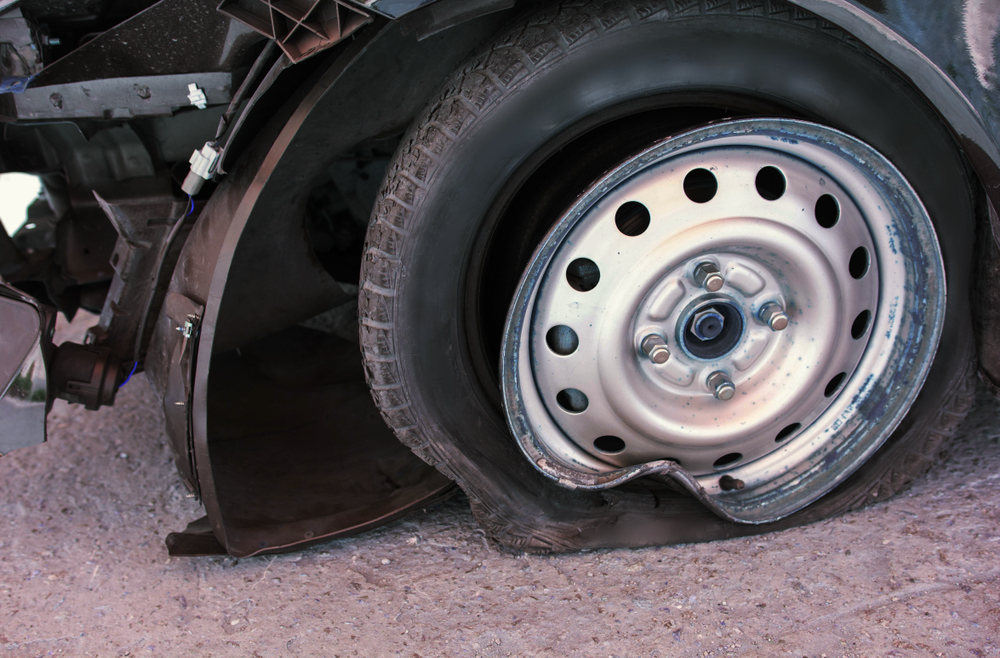

Detected Image:


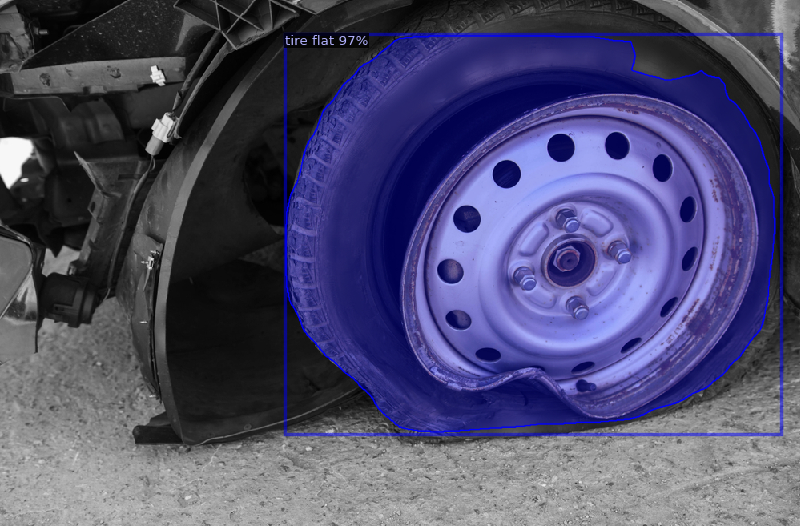

Total Repair Cost: Rs 1617


In [136]:
# image path
image_path = "/content/damage/dataa/test2017/000057.jpg"

# Call the function
Original_image, detected_image, repair_cost = car_damage_and_repair_cost_estimation(image_path, predictor, repair_costmodel)

# Display the original image
print("Original Image:")
img=cv2.imread(image_path)
cv2_imshow(img[:, :, ::-1])

# Display the detected image
print("Detected Image:")
cv2_imshow(detected_image)

# Display the repair cost
print(f"Total Repair Cost: Rs {repair_cost:.0f}")